##  Libraries

In [ ]:

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import sys
import albumentations as A
from albumentations.pytorch import ToTensorV2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from PIL import Image
import os
import pathlib
from tqdm import tqdm
import rioxarray as rxr
import rasterio
from sklearn.metrics import accuracy_score, precision_score, recall_score
import requests
import pyunpack
from rarfile import RarFile

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}')
if torch.cuda.is_available():
    print(f'GPU: {torch.cuda.get_device_name(0)}')
    print(f'Memory: {torch.cuda.get_device_properties(0).total_memory / 1024**3:.2f} GB')

torch.manual_seed(42)
np.random.seed(42)
if torch.cuda.is_available():
    torch.cuda.manual_seed(42)

Using device: cuda
GPU: NVIDIA GeForce RTX 4070 Laptop GPU
Memory: 8.00 GB


## Old Trainning Loop

In [ ]:

def compute_metrics(pred, target):
    """
    Compute accuracy and MSE metrics.
    
    Args:
        pred: predicted masks (B, 1, H, W)
        target: ground truth masks (B, 1, H, W)
    
    Returns:
        accuracy, mse
    """
    probs = torch.sigmoid(pred)

    pred_binary = (probs > 0.5).float()
    accuracy = (pred_binary == target).float().mean().item()
    mse = F.mse_loss(probs, target).item()
    
    return accuracy, mse

def train_model(model, train_loader, val_loader, criterion, optimizer,
                num_epochs=30, steps_per_epoch=100, device='cuda',
                save_path='model.pth', verbose=1):
    """
    Training loop matching
    Args:
        model: PyTorch model
        train_loader: training DataLoader
        val_loader: validation DataLoader
        criterion: loss function
        optimizer: optimizer
        num_epochs: number of epochs
        steps_per_epoch: iterations per epoch (matches TF)
        device: 'cuda' or 'cpu'
        save_path: path to save best model
        verbose: print frequency (0=silent, 1=progress bar, 2=one line per epoch)
    
    Returns:
        history: dict with training metrics
    """
    model.to(device)
    best_val_acc = 0.0
    
    history = {
        'loss': [],
        'accuracy': [],
        'mse': [],
        'val_loss': [],
        'val_accuracy': [],
        'val_mse': []
    }
    
    for epoch in range(num_epochs):

        model.train()
        train_loss = 0.0
        train_acc = 0.0
        train_mse = 0.0
        train_iter = iter(train_loader)

        if verbose == 1:
            pbar = tqdm(range(steps_per_epoch), desc=f'Epoch {epoch+1}/{num_epochs}')
        else:
            pbar = range(steps_per_epoch)
        
        for step in pbar:
            try:
                images, masks = next(train_iter)
            except StopIteration:
                train_iter = iter(train_loader)
                images, masks = next(train_iter)
            
            images = images.to(device)
            #masks = masks.to(device)
            masks = masks.to(device).float()

            if len(masks.shape) == 3:#
                masks = masks.unsqueeze(1)#
            
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, masks)
            
            loss.backward()
            optimizer.step()
            

            acc, mse = compute_metrics(outputs, masks)
            
            train_loss += loss.item()
            train_acc += acc
            train_mse += mse
            
            if verbose == 1:
                pbar.set_postfix({
                    'loss': f'{loss.item():.4f}',
                    'acc': f'{acc:.4f}'
                })
        
        train_loss /= steps_per_epoch
        train_acc /= steps_per_epoch
        train_mse /= steps_per_epoch
        
        model.eval()
        val_loss = 0.0
        val_acc = 0.0
        val_mse = 0.0
        
        with torch.no_grad():
            for images, masks in val_loader:
                images = images.to(device)
                masks = masks.to(device).float()

                if len(masks.shape) == 3:#
                    masks = masks.unsqueeze(1)#
                
                outputs = model(images)
                loss = criterion(outputs, masks)
                
                acc, mse = compute_metrics(outputs, masks)
                
                val_loss += loss.item()
                val_acc += acc
                val_mse += mse
        
        val_loss /= len(val_loader)
        val_acc /= len(val_loader)
        val_mse /= len(val_loader)
    
        if val_acc > best_val_acc:
            best_val_acc = val_acc
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'val_acc': val_acc,
                'val_loss': val_loss
            }, save_path)
            if verbose >= 1:
                print(f"\nEpoch {epoch+1}: val_accuracy improved to {val_acc:.4f}, saving model to {save_path}")
        
        history['loss'].append(train_loss)
        history['accuracy'].append(train_acc)
        history['mse'].append(train_mse)
        history['val_loss'].append(val_loss)
        history['val_accuracy'].append(val_acc)
        history['val_mse'].append(val_mse)
        
        if verbose == 2 or (verbose == 1 and epoch % 5 == 0):
            print(f"Epoch {epoch+1}/{num_epochs} - "
                  f"loss: {train_loss:.4f} - acc: {train_acc:.4f} - mse: {train_mse:.4f} - "
                  f"val_loss: {val_loss:.4f} - val_acc: {val_acc:.4f} - val_mse: {val_mse:.4f}")
    
    return history

def plot_training_history(history, save_path=None):
    """
    Plot training history
    
    Args:
        history: dict with keys ['loss', 'accuracy', 'val_loss', 'val_accuracy']
        save_path: optional path to save figure
    """
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    
    axes[0].plot(history['accuracy'], label='Training')
    axes[0].plot(history['val_accuracy'], label='Validation')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Accuracy')
    axes[0].set_title('Model Accuracy')
    axes[0].legend(loc='upper left')
    axes[0].grid(True)
    
    # Loss plot
    axes[1].plot(history['loss'], label='Training')
    axes[1].plot(history['val_loss'], label='Validation')
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('Loss')
    axes[1].set_title('Model Loss')
    axes[1].legend(loc='upper left')
    axes[1].grid(True)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
    
    plt.show()

## Old Model arquitecture 

In [ ]:
# Model 2: Attention U-Net (PRIMARY MODEL)

class AttentionBlock(nn.Module):
    """
    Attention Gate for Attention U-Net.
    """
    def __init__(self, F_g, F_l, F_int):
        """
        Args:
            F_g: number of filters in gating signal
            F_l: number of filters in skip connection
            F_int: number of intermediate filters
        """
        super(AttentionBlock, self).__init__()
        
        self.W_g = nn.Sequential(
            nn.Conv2d(F_g, F_int, kernel_size=1, stride=1, padding=0, bias=True),
            #nn.BatchNorm2d(F_int)
        )
        
        self.W_x = nn.Sequential(
            nn.Conv2d(F_l, F_int, kernel_size=1, stride=1, padding=0, bias=True),
            #nn.BatchNorm2d(F_int)
        )
        
        self.psi = nn.Sequential(
            nn.Conv2d(F_int, 1, kernel_size=1, stride=1, padding=0, bias=True),
            #nn.BatchNorm2d(1),
            nn.Sigmoid()
        )
        
        self.relu = nn.ReLU(inplace=True)
        
    def forward(self, g, x):
        """
        Args:
            g: gating signal from decoder (coarser scale)
            x: skip connection from encoder (finer scale)
        
        Returns:
            attention-weighted skip connection
        """

        g1 = self.W_g(g)
        

        x1 = self.W_x(x)
        x1 = F.max_pool2d(x1, kernel_size=2, stride=2)
        psi = self.relu(g1 + x1)
        psi = self.psi(psi)
        
        psi = F.interpolate(psi, size=x.shape[2:], mode='bilinear', align_corners=True)
        
        out = x * psi
        
        return out

class AttentionUNet(nn.Module):
    """
    Attention U-Net architecture.
    
    Architecture:
    - Encoder: 4 blocks with progressive filters
    - Bottleneck: Highest filter count
    - Decoder: 4 blocks with attention gates
    - Attention gates applied at each decoder level
    """
    def __init__(self, in_channels=3, out_channels=1, filter_base=16):
        """
        Args:
            in_channels: input channels (3 for RGB, 4 for 4-band)
            out_channels: output channels (1 for binary)
            filter_base: base number of filters (16 in original)
        """
        super(AttentionUNet, self).__init__()
        

        filters = [filter_base * (2**i) for i in range(5)]

        self.encoder1 = self._conv_block(in_channels, filters[0])
        self.pool1 = nn.MaxPool2d(2, 2)
        
        self.encoder2 = self._conv_block(filters[0], filters[1])
        self.pool2 = nn.MaxPool2d(2, 2)
        
        self.encoder3 = self._conv_block(filters[1], filters[2])
        self.pool3 = nn.MaxPool2d(2, 2)
        
        self.encoder4 = self._conv_block(filters[2], filters[3])
        self.pool4 = nn.MaxPool2d(2, 2)

        self.bottleneck = self._conv_block(filters[3], filters[4])
 
        self.att4 = AttentionBlock(F_g=filters[4], F_l=filters[3], F_int=filters[3])
        self.att3 = AttentionBlock(F_g=filters[3], F_l=filters[2], F_int=filters[2])
        self.att2 = AttentionBlock(F_g=filters[2], F_l=filters[1], F_int=filters[1])
        self.att1 = AttentionBlock(F_g=filters[1], F_l=filters[0], F_int=filters[0])
        
        self.upconv4 = nn.ConvTranspose2d(filters[4], filters[3], kernel_size=2, stride=2)
        self.decoder4 = self._conv_block(filters[4], filters[3])
        
        self.upconv3 = nn.ConvTranspose2d(filters[3], filters[2], kernel_size=2, stride=2)
        self.decoder3 = self._conv_block(filters[3], filters[2])
        
        self.upconv2 = nn.ConvTranspose2d(filters[2], filters[1], kernel_size=2, stride=2)
        self.decoder2 = self._conv_block(filters[2], filters[1])
        
        self.upconv1 = nn.ConvTranspose2d(filters[1], filters[0], kernel_size=2, stride=2)
        self.decoder1 = self._conv_block(filters[1], filters[0])
        
        self.conv_out = nn.Conv2d(filters[0], out_channels, kernel_size=1)

        self._init_weights()

    def _init_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)
        
    def _conv_block(self, in_channels, out_channels):
        """
        Matches convBlock2 from TensorFlow.
        Two convolutions with ReLU activations.
        """
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, padding=1),
            nn.ReLU(inplace=True)
        )
    
    def forward(self, x):
        # Encoder
        enc1 = self.encoder1(x)
        enc2 = self.encoder2(self.pool1(enc1))
        enc3 = self.encoder3(self.pool2(enc2))
        enc4 = self.encoder4(self.pool3(enc3))
        
        bottleneck = self.bottleneck(self.pool4(enc4))
        
        d4 = self.upconv4(bottleneck)
        enc4_att = self.att4(g=bottleneck, x=enc4)
        d4 = torch.cat([d4, enc4_att], dim=1)
        d4 = self.decoder4(d4)
        
        d3 = self.upconv3(d4)
        enc3_att = self.att3(g=d4, x=enc3)
        d3 = torch.cat([d3, enc3_att], dim=1)
        d3 = self.decoder3(d3)
        
        d2 = self.upconv2(d3)
        enc2_att = self.att2(g=d3, x=enc2)
        d2 = torch.cat([d2, enc2_att], dim=1)
        d2 = self.decoder2(d2)
        
        d1 = self.upconv1(d2)
        enc1_att = self.att1(g=d2, x=enc1)
        d1 = torch.cat([d1, enc1], dim=1)#torch.cat([d1, enc1_att], dim=1)#torch.cat([d1, enc1], dim=1)#torch.cat([d1, enc1_att], dim=1)
        d1 = self.decoder1(d1)

        out = self.conv_out(d1)#torch.sigmoid(self.conv_out(d1))
        
        return out

## Loading Data

In [49]:
import os
import glob
import numpy as np
import torch
import rasterio
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
import cv2


base_dir = "/home/dhuencho/dev_py/0001_start_pytorch/src/UCL_AI4SD/CW2/attention-mechanism-unet/chile3/Validation" 
BATCH_SIZE = 2

def get_4band_transforms(split="train", img_size=512):
    transforms_list = [
        A.Resize(height=img_size, width=img_size, interpolation=cv2.INTER_LINEAR),
    ]
    
    if split == "train":
        transforms_list.extend([

            A.Rotate(limit=180, border_mode=cv2.BORDER_REFLECT_101, p=0.7),
            A.ShiftScaleRotate(
                shift_limit=0.25, 
                scale_limit=0.25, 
                rotate_limit=0, 
                border_mode=cv2.BORDER_REFLECT_101, 
                p=0.7
            ),
            A.Affine(shear=(-14, 14), border_mode=cv2.BORDER_REFLECT_101, p=0.5),
            A.HorizontalFlip(p=0.7),
            A.VerticalFlip(p=0.7),
        ])
    
    transforms_list.append(ToTensorV2())
    return A.Compose(transforms_list)

class FourBandAmazonDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform=None):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        with rasterio.open(self.image_paths[idx]) as src:

            image = src.read().transpose(1, 2, 0).astype(np.float32)
            img_min = image.min()
            img_max = image.max()
            image = (image - img_min) / (img_max - img_min + 1e-8)


        with rasterio.open(self.mask_paths[idx]) as src:
            mask = src.read(1).astype(np.float32)

        h, w = image.shape[:2]
        mh, mw = mask.shape[:2]
        
        if mh != h or mw != w:
            mask = mask[:h, :w]

        if self.transform:
            transformed = self.transform(image=image, mask=mask)
            image = transformed["image"]
            mask = transformed["mask"]

        if not isinstance(mask, torch.Tensor):
            mask = torch.from_numpy(mask)
        
        mask = mask.long()

        return image, mask

def get_all_filepaths(root_dir):
    """
    Reads all files from root_dir/images and matches them with root_dir/masks
    """
    img_dir = os.path.join(root_dir, "images")
    mask_dir = os.path.join(root_dir, "masks")
    
    image_files = sorted(glob.glob(os.path.join(img_dir, "*")))
    
    mask_files = []
    valid_imgs = []
    
    for img_path in image_files:
        filename = os.path.basename(img_path)
        mask_path = os.path.join(mask_dir, filename)
        
        if os.path.exists(mask_path):
            valid_imgs.append(img_path)
            mask_files.append(mask_path)
        else:
            print(f"⚠️ Warning: Mask not found for {filename}, skipping.")
            
    return valid_imgs, mask_files


print("Scanning files...")
all_imgs, all_masks = get_all_filepaths(base_dir)
print(f"Found {len(all_imgs)} valid image/mask pairs.")

train_imgs, temp_imgs, train_masks, temp_masks = train_test_split(
    all_imgs, all_masks, test_size=0.20, random_state=42, shuffle=True
)

val_imgs, test_imgs, val_masks, test_masks = train_test_split(
    temp_imgs, temp_masks, test_size=0.50, random_state=42, shuffle=True
)

print(f"Split breakdown: Train: {len(train_imgs)}, Val: {len(val_imgs)}, Test: {len(test_imgs)}")

train_ds = FourBandAmazonDataset(train_imgs, train_masks, transform=get_4band_transforms("train"))
val_ds = FourBandAmazonDataset(val_imgs, val_masks, transform=get_4band_transforms("val")) # No geometric aug
test_ds = FourBandAmazonDataset(test_imgs, test_masks, transform=get_4band_transforms("val"))  # No geometric aug

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
val_loader = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)
test_loader = DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

print("4-Band Pipeline Ready with Auto-Split")

Scanning files...
Found 38 valid image/mask pairs.
Split breakdown: Train: 30, Val: 4, Test: 4
4-Band Pipeline Ready with Auto-Split


/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


In [3]:
images, masks = next(iter(train_loader))
print(f"Image shape: {images.shape}")

Image shape: torch.Size([2, 4, 512, 512])


VISUALIZING TRAINING DATA (Should show rotation/flips/reflection):
--- Visualizing 3 Samples from 4-Band Dataset ---


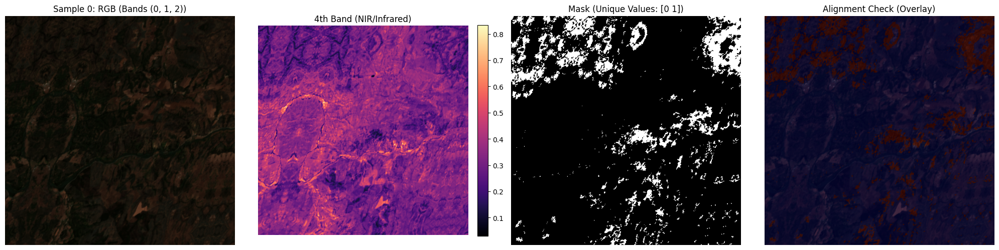

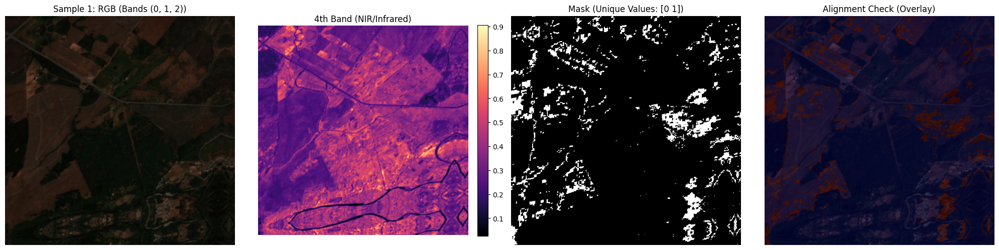

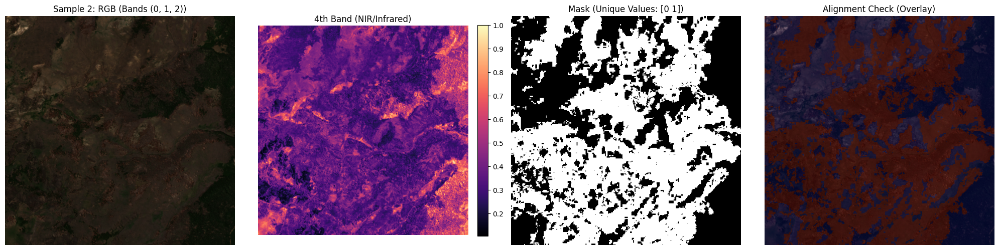


VISUALIZING VALIDATION DATA (Should be standard):
--- Visualizing 2 Samples from 4-Band Dataset ---


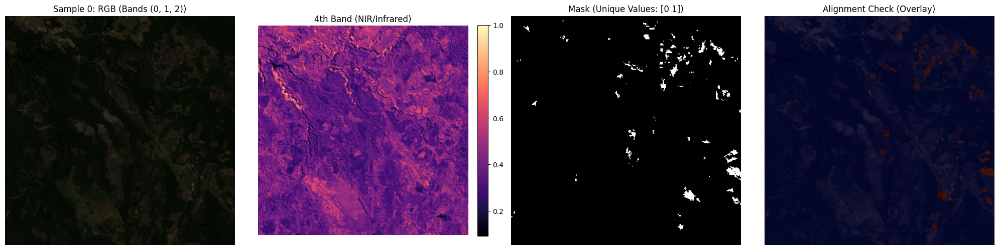

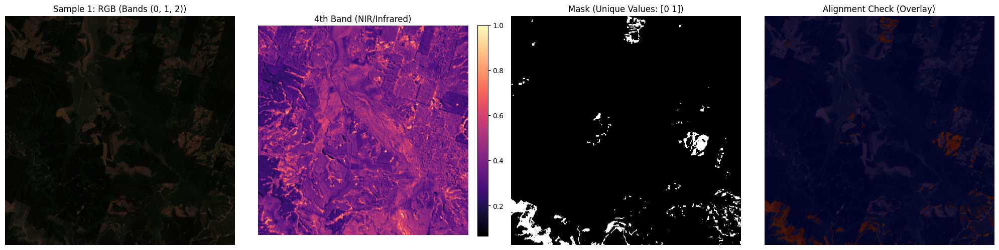

In [ ]:

def visualize_4band_dataset(dataset, num_samples=3, band_order=(0, 1, 2)):
    """
    Visualizes 4-band imagery by splitting it into RGB and the 4th Band (NIR).
    
    Args:
        dataset: FourBandAmazonDataset         
        num_samples: How many images to show
        band_order: Indices of (Red, Green, Blue) bands. 
                    Default (0,1,2) assumes the Tiff is saved as R-G-B-NIR.
    """
    

    loader = torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=True)
    
    print(f"--- Visualizing {num_samples} Samples from 4-Band Dataset ---")
    
    for i, (image, mask) in enumerate(loader):
        if i >= num_samples:
            break
            

        img_tensor = image.squeeze(0)
        mask_tensor = mask.squeeze(0)

        r_band = img_tensor[band_order[0], :, :].numpy()
        g_band = img_tensor[band_order[1], :, :].numpy()
        b_band = img_tensor[band_order[2], :, :].numpy()

        rgb_img = np.stack([r_band, g_band, b_band], axis=-1)
        
        nir_band = img_tensor[3, :, :].numpy()
    
        mask_img = mask_tensor.squeeze().numpy()

        fig, ax = plt.subplots(1, 4, figsize=(20, 5))
        
        ax[0].imshow(rgb_img)
        ax[0].set_title(f"Sample {i}: RGB (Bands {band_order})")
        ax[0].axis('off')

        im_nir = ax[1].imshow(nir_band, cmap='magma')
        ax[1].set_title("4th Band (NIR/Infrared)")
        ax[1].axis('off')
        plt.colorbar(im_nir, ax=ax[1], fraction=0.046, pad=0.04)
        
        ax[2].imshow(mask_img, cmap='gray')
        ax[2].set_title(f"Mask (Unique Values: {np.unique(mask_img)})")
        ax[2].axis('off')

        ax[3].imshow(rgb_img)
        ax[3].imshow(mask_img, cmap='jet', alpha=0.3) 
        ax[3].set_title("Alignment Check (Overlay)")
        ax[3].axis('off')
        
        plt.tight_layout()
        plt.show()


print("VISUALIZING TRAINING DATA (Should show rotation/flips/reflection):")
visualize_4band_dataset(train_ds, num_samples=3)

print("\nVISUALIZING VALIDATION DATA (Should be standard):")
visualize_4band_dataset(val_ds, num_samples=2)

## Training



In [50]:
os.makedirs('models_pytorch', exist_ok=True)
os.makedirs('figures_pytorch', exist_ok=True)
os.makedirs('metrics_pytorch', exist_ok=True)

# Loss function
#criterion = nn.BCELoss()
criterion = nn.BCEWithLogitsLoss()

print("Setup complete. Ready for training.")

Setup complete. Ready for training.


In [ ]:
# # Attention U-Net on RGB (3-channel)

# print("Training Attention U-Net on RGB data...\n")

# model_attn_unet_4band = AttentionUNet(in_channels=4, out_channels=1, filter_base=16).to(device)
# optimizer_attn_unet_4band = torch.optim.Adam(model_attn_unet_4band.parameters(), lr=0.0005,
#                                            betas=(0.9, 0.999), eps=1e-7)

# # scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
# #     optimizer_attn_unet_4band, mode='min', factor=0.1, patience=5, verbose=True
# # )                                           

# history_attn_unet_4band = train_model(
#     model_attn_unet_4band,
#     train_loader_4band,
#     val_loader_4band,
#     criterion,
#     optimizer_attn_unet_4band,
#     num_epochs=60,
#     steps_per_epoch=100,
#     device=device,
#     save_path='models_pytorch/attention-unet-4d.pth',
#     verbose=1
# )

# # Save history
# np.save('models_pytorch/attention-unet-4d-history.npy', history_attn_unet_4band)

# # Plot training curves
# plot_training_history(history_attn_unet_4band,
#                      save_path='figures_pytorch/attention-unet-4d-history.png')

## New pipeline

In [ ]:
# Chile 3 is the last iteration of the Chile dataset with the noisy mask that differ from the previous versions.

base_dir = "/home/dhuencho/dev_py/0001_start_pytorch/src/UCL_AI4SD/CW2/attention-mechanism-unet/chile3/Validation"

def get_all_filepaths(root_dir):
    img_dir = os.path.join(root_dir, "images")
    mask_dir = os.path.join(root_dir, "masks")
    image_files = sorted(glob.glob(os.path.join(img_dir, "*")))
    mask_files = []
    valid_imgs = []
    for img_path in image_files:
        filename = os.path.basename(img_path)
        mask_path = os.path.join(mask_dir, filename)
        if os.path.exists(mask_path):
            valid_imgs.append(img_path)
            mask_files.append(mask_path)
    return valid_imgs, mask_files

all_imgs, all_masks = get_all_filepaths(base_dir)


TRAIN_IMG, VAL_IMG, TRAIN_MASK, VAL_MASK = train_test_split(
    all_imgs, all_masks, test_size=0.40, random_state=704, shuffle=True
)
# VAL_IMG, TEST_IMG, VAL_MASK, TEST_MASK = train_test_split(
#     temp_imgs, temp_masks, test_size=0.0, random_state=42, shuffle=True
# )

print(f"Ready for Optuna: Train: {len(TRAIN_IMG)}, Val: {len(VAL_IMG)}")

Scanning files...
Ready for Optuna: Train: 22, Val: 16


In [ ]:
def get_dataloaders(batch_size, num_workers=2):
    """
    Creates DataLoaders using the pre-loaded global file lists.
    Args:
        batch_size: Int, defined by Optuna or fixed config.
    """

    train_ds = FourBandAmazonDataset(
        TRAIN_IMG, 
        TRAIN_MASK, 
        transform=get_4band_transforms("train")
    )
    
    val_ds = FourBandAmazonDataset(
        VAL_IMG, 
        VAL_MASK, 
        transform=get_4band_transforms("val") 
    )


    train_loader = DataLoader(
        train_ds, 
        batch_size=batch_size, 
        shuffle=True, 
        num_workers=num_workers,
        pin_memory=True,
        drop_last=True 
    )
    
    val_loader = DataLoader(
        val_ds, 
        batch_size=batch_size, 
        shuffle=False, 
        num_workers=num_workers,
        pin_memory=True,
        drop_last=False
    )
    
    return train_loader, val_loader

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import optuna

class AttentionBlock(nn.Module):
    def __init__(self, F_g, F_l, F_int):
        super(AttentionBlock, self).__init__()
        self.W_g = nn.Sequential(
            nn.Conv2d(F_g, F_int, kernel_size=1, stride=1, padding=0, bias=True),
        )
        self.W_x = nn.Sequential(
            nn.Conv2d(F_l, F_int, kernel_size=1, stride=1, padding=0, bias=True),
        )
        self.psi = nn.Sequential(
            nn.Conv2d(F_int, 1, kernel_size=1, stride=1, padding=0, bias=True),
            nn.Sigmoid()
        )
        self.relu = nn.ReLU(inplace=True)

    def forward(self, g, x):
        g1 = self.W_g(g)
        x1 = self.W_x(x)
        x1 = F.max_pool2d(x1, kernel_size=2, stride=2)
        psi = self.relu(g1 + x1)
        psi = self.psi(psi)
        psi = F.interpolate(psi, size=x.shape[2:], mode='bilinear', align_corners=True)
        return x * psi

class FlexibleAttentionUNet(nn.Module):
    """
    Flexible Attention U-Net with Dynamic Depth and Dropout.
    """
    def __init__(self, in_channels=3, out_channels=1, depth=4, filter_base=16, 
                 use_batchnorm=False, dropout_rate=0.0):
        super(FlexibleAttentionUNet, self).__init__()
        self.depth = depth
        self.dropout_rate = dropout_rate
        

        self.filters = [filter_base * (2**i) for i in range(depth + 1)]
        
        self.encoders = nn.ModuleList()
        self.pools = nn.ModuleList()
        self.decoders = nn.ModuleList()
        self.upconvs = nn.ModuleList()
        self.attentions = nn.ModuleList()

        current_in = in_channels
        for i in range(depth):
            self.encoders.append(self._conv_block(current_in, self.filters[i], use_batchnorm))
            self.pools.append(nn.MaxPool2d(2, 2))
            current_in = self.filters[i]
            
        self.bottleneck = self._conv_block(self.filters[depth-1], self.filters[depth], use_batchnorm)
        

        for i in range(depth - 1, -1, -1):
            self.upconvs.append(nn.ConvTranspose2d(self.filters[i+1], self.filters[i], kernel_size=2, stride=2))
            self.attentions.append(AttentionBlock(F_g=self.filters[i+1], F_l=self.filters[i], F_int=self.filters[i]))
            self.decoders.append(self._conv_block(self.filters[i] * 2, self.filters[i], use_batchnorm))
            
        self.conv_out = nn.Conv2d(self.filters[0], out_channels, kernel_size=1)
        self._init_weights()

    def _conv_block(self, in_c, out_c, batchnorm):
        """
        Constructs a block: Conv -> BN (opt) -> ReLU -> Dropout (opt) -> Conv -> ...
        """
        layers = []
        
        layers.append(nn.Conv2d(in_c, out_c, 3, padding=1))
        if batchnorm: layers.append(nn.BatchNorm2d(out_c))
        layers.append(nn.ReLU(inplace=True))

        if self.dropout_rate > 0:
            layers.append(nn.Dropout2d(p=self.dropout_rate))
            
        layers.append(nn.Conv2d(out_c, out_c, 3, padding=1))
        if batchnorm: layers.append(nn.BatchNorm2d(out_c))
        layers.append(nn.ReLU(inplace=True))

        if self.dropout_rate > 0:
            layers.append(nn.Dropout2d(p=self.dropout_rate))
            
        return nn.Sequential(*layers)

    def _init_weights(self):
        for m in self.modules():
            if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d)):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')

    def forward(self, x):
        skips = []
        
        # Encoder
        for i in range(self.depth):
            x = self.encoders[i](x)
            skips.append(x)
            x = self.pools[i](x)
            
        x = self.bottleneck(x)
        
        # Decoder
        for i in range(self.depth):
            skip = skips[-(i+1)]
            g = x
            x = self.upconvs[i](x)
            attn = self.attentions[i](g=g, x=skip)
            x = torch.cat([x, attn], dim=1)
            x = self.decoders[i](x)
            
        return self.conv_out(x)

### Model Test

In [51]:
def test_flexible_architecture():

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"🔬 Running Robust Architecture Tests on: {device}\n")

    test_cases = [
        (
            "Standard RGB U-Net (Depth 4)", 
            {'in_channels': 3, 'out_channels': 1, 'depth': 4, 'filter_base': 16, 'dropout_rate': 0.0},
            3, (512, 512)
        ),
        (
            "Sentinel 4-Band U-Net (Depth 4)", 
            {'in_channels': 4, 'out_channels': 1, 'depth': 4, 'filter_base': 16, 'dropout_rate': 0.1},
            4, (512, 512)
        ),
        (
            "Deep & Heavy (Depth 5, Filters 32)", 
            {'in_channels': 3, 'out_channels': 1, 'depth': 5, 'filter_base': 32, 'dropout_rate': 0.3},
            3, (256, 256)
        ),
        (
            "Shallow & Fast (Depth 2)", 
            {'in_channels': 4, 'out_channels': 1, 'depth': 2, 'filter_base': 16, 'use_batchnorm': True},
            4, (512, 512)
        ),
        (
            "Binary Output (Logits check)", 
            {'in_channels': 3, 'out_channels': 1, 'depth': 3, 'filter_base': 16},
            3, (128, 128)
        )
    ]

    print(f"{'Test Case':<35} | {'Status':<8} | {'Shape':<20} | {'Params':<12} | {'NaN Check':<10}")
    print("-" * 105)

    for name, kwargs, in_ch, (h, w) in test_cases:
        batch_size = 1
        test_input = torch.randn(batch_size, in_ch, h, w).to(device)
        
        try:
            model = FlexibleAttentionUNet(**kwargs).to(device)
            model.eval()
            
            with torch.no_grad():
                output = model(test_input)
            
            expected_shape = (batch_size, kwargs['out_channels'], h, w)
            shape_ok = (output.shape == expected_shape)
            has_nan = torch.isnan(output).any().item()
            num_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
            

            status = "PASS" if shape_ok and not has_nan else "FAIL"
            status_icon = "✓" if status == "PASS" else "✗"
            nan_status = "Clean" if not has_nan else "DETECTED!"
            
            print(f"{status_icon} {name:<33} | {status:<8} | {str(tuple(output.shape)):<20} | {num_params:<12,} | {nan_status:<10}")
            

            if not shape_ok:
                print(f"   >>> ERROR: Shape Mismatch! Expected {expected_shape}, got {output.shape}")
            if has_nan:
                print(f"   >>> ERROR: Numerical Instability! Output contains NaNs.")
                
        except Exception as e:
            print(f"✗ {name:<33} | CRASHED  | {str(e)}")

    print("-" * 105)
    print("\n All architecture tests completed.")

test_flexible_architecture()

🔬 Running Robust Architecture Tests on: cuda

Test Case                           | Status   | Shape                | Params       | NaN Check 
---------------------------------------------------------------------------------------------------------
✓ Standard RGB U-Net (Depth 4)      | PASS     | (1, 1, 512, 512)     | 2,007,109    | Clean     
✓ Sentinel 4-Band U-Net (Depth 4)   | PASS     | (1, 1, 512, 512)     | 2,007,253    | Clean     
✓ Deep & Heavy (Depth 5, Filters 32) | PASS     | (1, 1, 256, 256)     | 32,145,030   | Clean     
✓ Shallow & Fast (Depth 2)          | PASS     | (1, 1, 512, 512)     | 121,811      | Clean     
✓ Binary Output (Logits check)      | PASS     | (1, 1, 128, 128)     | 498,500      | Clean     
---------------------------------------------------------------------------------------------------------

 All architecture tests completed.


### Optuna optimization pipeline

In [ ]:
class EarlyStopping:
    """Stop training if metric doesn't improve after 'patience' epochs"""
    def __init__(self, patience=5, min_delta=0.001, mode='max'):
        self.patience = patience
        self.min_delta = min_delta
        self.mode = mode
        self.best_score = None
        self.counter = 0
        self.early_stop = False

    def __call__(self, current_score):
        if self.best_score is None:
            self.best_score = current_score
        
        improved = False
        if self.mode == 'max':
            if current_score > self.best_score + self.min_delta:
                self.best_score = current_score
                improved = True
        elif self.mode == 'min':
            if current_score < self.best_score - self.min_delta:
                self.best_score = current_score
                improved = True
                
        if improved:
            self.counter = 0
        else:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True

In [ ]:
def compute_metrics(pred, target):
    probs = torch.sigmoid(pred)
    pred_binary = (probs > 0.5).float()
    accuracy = (pred_binary == target).float().mean().item()
    return accuracy

def calculate_metrics(pred_logits, target_mask):
    """
    Computes Accuracy, MSE, and Dice Score.
    Args:
        pred_logits: (B, 1, H, W) float tensor
        target_mask: (B, H, W) or (B, 1, H, W) long/float tensor
    Returns:
        dict: {'acc': float, 'mse': float, 'dice': float}
    """

    probs = torch.sigmoid(pred_logits)
    pred_binary = (probs > 0.5).float()
    if len(target_mask.shape) == 3:
        target_mask = target_mask.unsqueeze(1)
    target_float = target_mask.float()
    

    correct = (pred_binary == target_float).sum()
    total = torch.numel(target_float)
    acc = (correct / total).item()
    

    mse = F.mse_loss(probs, target_float).item()

    intersection = (pred_binary * target_float).sum()
    union = pred_binary.sum() + target_float.sum()
    dice = (2.0 * intersection / (union + 1e-8)).item()
    
    return {'acc': acc, 'mse': mse, 'dice': dice}

def train_model_optuna(trial, model, train_loader, val_loader, criterion, optimizer, 
                       num_epochs=10, device='cuda'):
    model.to(device)
    
    early_stopper = EarlyStopping(patience=6, mode='max')
    best_weighted_score = -float('inf')

    for epoch in range(num_epochs):
        model.train()
        for images, masks in train_loader:
            images, masks = images.to(device), masks.to(device).float()
            if len(masks.shape) == 3: masks = masks.unsqueeze(1)
            
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()
            
        model.eval()
        val_acc = 0.0
        val_metrics = {'acc': 0.0, 'mse': 0.0, 'dice': 0.0}
        steps = 0

        with torch.no_grad():
            for images, masks in val_loader:
                images, masks = images.to(device), masks.to(device).float()
                if len(masks.shape) == 3: masks = masks.unsqueeze(1)
                outputs = model(images)
                val_acc += compute_metrics(outputs, masks)

                batch_metrics = calculate_metrics(outputs, masks)
                
                for k, v in batch_metrics.items():
                    val_metrics[k] += v
                steps += 1
        
        val_acc /= len(val_loader)

        for k in val_metrics:
            val_metrics[k] /= steps
        
        w_acc, w_dice, w_mse = 1.0, 1.5, 0.5
        weighted_score = (w_acc * val_metrics['acc']) + (w_dice * val_metrics['dice']) - (w_mse * val_metrics['mse'])

        # Track best score for this trial
        if weighted_score > best_weighted_score:
            best_weighted_score = weighted_score

        trial.report(weighted_score, epoch)

        if trial.should_prune():
            raise optuna.exceptions.TrialPruned()
        
        early_stopper(weighted_score)
        if early_stopper.early_stop:
            break
        
        trial.set_user_attr("epochs_run", epoch + 1)
            
    return val_metrics

In [ ]:
import torch
import torch.nn as nn

class ComboLoss(nn.Module):
    def __init__(self, bce_weight=0.5):
        super(ComboLoss, self).__init__()
        self.bce_weight = bce_weight
        self.dice_weight = 1 - bce_weight
        self.bce = nn.BCEWithLogitsLoss() 

    def forward(self, logits, targets):
        loss_bce = self.bce(logits, targets)
        probs = torch.sigmoid(logits)
        
        probs_flat = probs.view(-1)
        targets_flat = targets.view(-1)
        
        intersection = (probs_flat * targets_flat).sum()
        dice_score = (2. * intersection + 1) / (probs_flat.sum() + targets_flat.sum() + 1)
        loss_dice = 1 - dice_score
        
        return (self.bce_weight * loss_bce) + (self.dice_weight * loss_dice)

In [ ]:
def objective(trial):

    depth = trial.suggest_int('depth', 3,3)
    filter_base = trial.suggest_categorical('filter_base', [16, 32, 64])
    use_batchnorm = trial.suggest_categorical('use_batchnorm', [True, False])
    
    dropout_rate = trial.suggest_float('dropout_rate', 0.0, 0.5, step=0.1) 
    
    lr = trial.suggest_float('lr', 1e-5, 1e-2, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam'])

    batch_size = trial.suggest_categorical('batch_size', [1])
    
    W_ACC = 1.0
    W_DICE = 1.5 
    W_MSE = 0.5   


    model = FlexibleAttentionUNet(
        in_channels=4, 
        out_channels=1, 
        depth=depth, 
        filter_base=filter_base, 
        use_batchnorm=use_batchnorm,
        dropout_rate=dropout_rate 
    )
    
    if optimizer_name == 'Adam':
        optimizer = optim.Adam(model.parameters(), lr=lr)
    else:
        optimizer = optim.RMSprop(model.parameters(), lr=lr)
        
    criterion = ComboLoss(bce_weight=0.3)


    train_loader, val_loader = get_dataloaders(batch_size=batch_size)
    
    if len(train_loader) == 0:
        raise ValueError("Train loader is empty. Check dataset path.")
    

    try:

        final_metrics = train_model_optuna(
            trial, model, train_loader, val_loader, criterion, optimizer, 
            num_epochs=50, 
            device='cuda' if torch.cuda.is_available() else 'cpu'
        )


        score = (W_ACC * final_metrics['acc']) + (W_DICE * final_metrics['dice']) - (W_MSE * final_metrics['mse'])
        
        trial.set_user_attr("accuracy", final_metrics['acc'])
        trial.set_user_attr("dice", final_metrics['dice'])
        trial.set_user_attr("mse", final_metrics['mse'])
        


    except RuntimeError as e:
        if "out of memory" in str(e):
            torch.cuda.empty_cache()
            raise optuna.exceptions.TrialPruned()
        raise e

    return score

In [ ]:
seed = 42
torch.manual_seed(seed)


sampler = optuna.samplers.TPESampler(seed=seed)
pruner = optuna.pruners.MedianPruner(n_startup_trials=5, n_warmup_steps=2)

study = optuna.create_study(direction='maximize', sampler=sampler, pruner=pruner)

print("Starting optimization...")

study.optimize(objective, n_trials=20) 
print("\nBest trial:")
trial = study.best_trial
print(f"  Value (Val Acc): {trial.value:.4f}")
print("  Params: ")
for key, value in trial.params.items():
    print(f"    {key}: {value}")


print("\nBest Trial Component Metrics:")
print(f"  Accuracy: {trial.user_attrs['accuracy']:.4f}")
print(f"  Dice:     {trial.user_attrs['dice']:.4f}")
print(f"  MSE:      {trial.user_attrs['mse']:.4f}")    
print(f"  Epochs Run: {trial.user_attrs['epochs_run']}")

# optuna.visualization.plot_optimization_history(study).show()
# optuna.visualization.plot_param_importances(study).show()

[I 2025-12-11 07:26:02,234] A new study created in memory with name: no-name-537bf1e6-46db-465e-a804-c4c19d5ffbce


Starting optimization...


[I 2025-12-11 07:27:08,434] Trial 0 finished with value: 1.1549969000916462 and parameters: {'depth': 3, 'filter_base': 32, 'use_batchnorm': True, 'dropout_rate': 0.0, 'lr': 1.493656855461762e-05, 'optimizer': 'Adam', 'batch_size': 1}. Best is trial 0 with value: 1.1549969000916462.
[I 2025-12-11 07:27:18,765] Trial 1 finished with value: 0.7584093656189452 and parameters: {'depth': 3, 'filter_base': 16, 'use_batchnorm': False, 'dropout_rate': 0.4, 'lr': 4.335281794951564e-05, 'optimizer': 'Adam', 'batch_size': 1}. Best is trial 0 with value: 1.1549969000916462.
[I 2025-12-11 07:28:40,222] Trial 2 finished with value: 1.19471790548414 and parameters: {'depth': 3, 'filter_base': 64, 'use_batchnorm': True, 'dropout_rate': 0.1, 'lr': 0.000684792009557478, 'optimizer': 'Adam', 'batch_size': 1}. Best is trial 2 with value: 1.19471790548414.
[I 2025-12-11 07:30:05,380] Trial 3 finished with value: 1.1729747380595654 and parameters: {'depth': 3, 'filter_base': 64, 'use_batchnorm': False, 'dro

KeyboardInterrupt: 

Best trial:
  Value (Val Acc): 1.2531
  Params: 
    depth: 3
    filter_base: 16
    use_batchnorm: True
    dropout_rate: 0.0
    lr: 7.348118405270451e-05
    optimizer: Adam
    batch_size: 2

Best Trial Component Metrics:
  Accuracy: 0.7884
  Dice:     0.3635
  MSE:      0.1611
  Epochs Run: 37


  Best trial:
  Value (Val Acc): 1.2624
  Params: 
    depth: 3
    filter_base: 32
    use_batchnorm: True
    dropout_rate: 0.0
    lr: 8.556385477088219e-05
    optimizer: Adam
    batch_size: 1

Best Trial Component Metrics:
  Accuracy: 0.8556
  Dice:     0.3097
  MSE:      0.1155
  Epochs Run: 30

## Final Model

In [ ]:
def compute_metrics(pred_logits, target_mask):
    """Computes Acc, Dice, MSE"""
    probs = torch.sigmoid(pred_logits)
    pred_bin = (probs > 0.5).float()
    
    if target_mask.ndim == 3: target_mask = target_mask.unsqueeze(1)
    target = target_mask.float()
    
    correct = (pred_bin == target).sum()
    total = torch.numel(target)
    acc = (correct / total).item()
    
    mse = F.mse_loss(probs, target).item()
    
    inter = (pred_bin * target).sum()
    union = pred_bin.sum() + target.sum()
    dice = (2 * inter / (union + 1e-8)).item()
    
    return acc, mse, dice
    
def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs, device, save_path):
    model.to(device)
    best_val_dice = 0.0
    
    history = {'loss': [], 'acc': [], 'dice': [], 'val_loss': [], 'val_acc': [], 'val_dice': []}
    
    for epoch in range(num_epochs):

        model.train()
        running_loss, running_acc, running_dice = 0.0, 0.0, 0.0
        
        pbar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}")
        for imgs, masks in pbar:
            imgs = imgs.to(device)
            masks = masks.to(device).float().unsqueeze(1)
            
            optimizer.zero_grad()
            outputs = model(imgs)
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()
            
            acc, mse, dice = compute_metrics(outputs, masks)
            running_loss += loss.item()
            running_acc += acc
            running_dice += dice
            
            pbar.set_postfix({'loss': f"{loss.item():.4f}", 'acc': f"{acc:.4f}"})

        epoch_loss = running_loss / len(train_loader)
        epoch_acc = running_acc / len(train_loader)
        epoch_dice = running_dice / len(train_loader)
        
        model.eval()
        val_loss, val_acc, val_dice = 0.0, 0.0, 0.0
        with torch.no_grad():
            for imgs, masks in val_loader:
                imgs = imgs.to(device)
                masks = masks.to(device).float().unsqueeze(1)
                
                outputs = model(imgs)
                loss = criterion(outputs, masks)
                acc, mse, dice = compute_metrics(outputs, masks)
                
                val_loss += loss.item()
                val_acc += acc
                val_dice += dice
                
        val_loss /= len(val_loader)
        val_acc /= len(val_loader)
        val_dice /= len(val_loader)
        
        history['loss'].append(epoch_loss)
        history['acc'].append(epoch_acc)
        history['dice'].append(epoch_dice)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)
        history['val_dice'].append(val_dice)
        
        print(f"Epoch {epoch+1} Results: Train Loss: {epoch_loss:.4f} | Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f} | Val Dice: {val_dice:.4f}")
        
        if val_dice > best_val_dice:
            best_val_dice = val_dice
            torch.save(model.state_dict(), save_path)
            print(f"🔥 New Best Model Saved! (Dice: {best_val_dice:.4f})")
            
    return history

def plot_history(history, save_path):
    epochs = range(1, len(history['loss']) + 1)
    
    plt.figure(figsize=(18, 5))
    
    plt.subplot(1, 3, 1)
    plt.plot(epochs, history['loss'], label='Train')
    plt.plot(epochs, history['val_loss'], label='Val')
    plt.title('Loss')
    plt.legend()
    
    plt.subplot(1, 3, 2)
    plt.plot(epochs, history['acc'], label='Train')
    plt.plot(epochs, history['val_acc'], label='Val')
    plt.title('Accuracy')
    plt.legend()
    
    plt.subplot(1, 3, 3)
    plt.plot(epochs, history['dice'], label='Train')
    plt.plot(epochs, history['val_dice'], label='Val')
    plt.title('Dice Score')
    plt.legend()
    
    plt.savefig(save_path)
    plt.show()
    print(f"Plot saved to {save_path}")

In [ ]:
import torch
import torch.nn as nn

class ComboLoss(nn.Module):
    def __init__(self, bce_weight=0.5):
        super(ComboLoss, self).__init__()
        self.bce_weight = bce_weight
        self.dice_weight = 1 - bce_weight
        
        self.bce = nn.BCEWithLogitsLoss() 

    def forward(self, logits, targets):
        loss_bce = self.bce(logits, targets)
        
        probs = torch.sigmoid(logits)
        
        probs_flat = probs.view(-1)
        targets_flat = targets.view(-1)
        
        intersection = (probs_flat * targets_flat).sum()
        dice_score = (2. * intersection + 1) / (probs_flat.sum() + targets_flat.sum() + 1)
        loss_dice = 1 - dice_score
        
        return (self.bce_weight * loss_bce) + (self.dice_weight * loss_dice)

/home/dhuencho/dev_py/0001_start_pytorch/.venv/lib/python3.12/site-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


🚀 Starting Final Training...


Epoch 1/60: 100%|██████████| 22/22 [00:01<00:00, 17.49it/s, loss=1.4113, acc=0.0684]


Epoch 1 Results: Train Loss: 1.9722 | Val Loss: 1.1021 | Val Acc: 0.1413 | Val Dice: 0.2165
🔥 New Best Model Saved! (Dice: 0.2165)


Epoch 2/60: 100%|██████████| 22/22 [00:01<00:00, 21.06it/s, loss=1.1101, acc=0.1015]


Epoch 2 Results: Train Loss: 1.2514 | Val Loss: 0.8963 | Val Acc: 0.1511 | Val Dice: 0.2154


Epoch 3/60: 100%|██████████| 22/22 [00:01<00:00, 20.87it/s, loss=0.8868, acc=0.5618]


Epoch 3 Results: Train Loss: 0.9868 | Val Loss: 0.8378 | Val Acc: 0.4774 | Val Dice: 0.1825


Epoch 4/60: 100%|██████████| 22/22 [00:01<00:00, 20.93it/s, loss=0.7730, acc=0.6565]


Epoch 4 Results: Train Loss: 0.8823 | Val Loss: 1.1999 | Val Acc: 0.6418 | Val Dice: 0.1986


Epoch 5/60: 100%|██████████| 22/22 [00:01<00:00, 21.00it/s, loss=0.7570, acc=0.8137]


Epoch 5 Results: Train Loss: 0.7903 | Val Loss: 0.8189 | Val Acc: 0.7028 | Val Dice: 0.1934


Epoch 6/60: 100%|██████████| 22/22 [00:01<00:00, 21.05it/s, loss=0.8047, acc=0.8806]


Epoch 6 Results: Train Loss: 0.7602 | Val Loss: 1.0291 | Val Acc: 0.6980 | Val Dice: 0.2061


Epoch 7/60: 100%|██████████| 22/22 [00:01<00:00, 20.72it/s, loss=0.7651, acc=0.8490]


Epoch 7 Results: Train Loss: 0.7406 | Val Loss: 1.1150 | Val Acc: 0.6866 | Val Dice: 0.2187
🔥 New Best Model Saved! (Dice: 0.2187)


Epoch 8/60: 100%|██████████| 22/22 [00:01<00:00, 20.65it/s, loss=0.6446, acc=0.4725]


Epoch 8 Results: Train Loss: 0.7216 | Val Loss: 0.7813 | Val Acc: 0.7699 | Val Dice: 0.2365
🔥 New Best Model Saved! (Dice: 0.2365)


Epoch 9/60: 100%|██████████| 22/22 [00:01<00:00, 20.53it/s, loss=0.6669, acc=0.9002]


Epoch 9 Results: Train Loss: 0.7026 | Val Loss: 0.7388 | Val Acc: 0.7849 | Val Dice: 0.2197


Epoch 10/60: 100%|██████████| 22/22 [00:01<00:00, 20.77it/s, loss=0.5955, acc=0.8162]


Epoch 10 Results: Train Loss: 0.7156 | Val Loss: 0.7887 | Val Acc: 0.7469 | Val Dice: 0.2462
🔥 New Best Model Saved! (Dice: 0.2462)


Epoch 11/60: 100%|██████████| 22/22 [00:01<00:00, 20.88it/s, loss=0.6498, acc=0.8823]


Epoch 11 Results: Train Loss: 0.7013 | Val Loss: 0.6639 | Val Acc: 0.7930 | Val Dice: 0.2631
🔥 New Best Model Saved! (Dice: 0.2631)


Epoch 12/60: 100%|██████████| 22/22 [00:01<00:00, 20.46it/s, loss=0.7103, acc=0.8954]


Epoch 12 Results: Train Loss: 0.7315 | Val Loss: 0.9955 | Val Acc: 0.6872 | Val Dice: 0.2690
🔥 New Best Model Saved! (Dice: 0.2690)


Epoch 13/60: 100%|██████████| 22/22 [00:01<00:00, 20.67it/s, loss=0.6993, acc=0.8648]


Epoch 13 Results: Train Loss: 0.6996 | Val Loss: 0.6607 | Val Acc: 0.7753 | Val Dice: 0.2964
🔥 New Best Model Saved! (Dice: 0.2964)


Epoch 14/60: 100%|██████████| 22/22 [00:01<00:00, 20.62it/s, loss=0.7025, acc=0.8832]


Epoch 14 Results: Train Loss: 0.6871 | Val Loss: 0.6627 | Val Acc: 0.7732 | Val Dice: 0.2926


Epoch 15/60: 100%|██████████| 22/22 [00:01<00:00, 20.39it/s, loss=0.7912, acc=0.8524]


Epoch 15 Results: Train Loss: 0.6660 | Val Loss: 0.6622 | Val Acc: 0.7639 | Val Dice: 0.2873


Epoch 16/60: 100%|██████████| 22/22 [00:01<00:00, 20.50it/s, loss=0.5575, acc=0.8224]


Epoch 16 Results: Train Loss: 0.6721 | Val Loss: 0.6376 | Val Acc: 0.8340 | Val Dice: 0.2828


Epoch 17/60: 100%|██████████| 22/22 [00:01<00:00, 19.62it/s, loss=0.7011, acc=0.7495]


Epoch 17 Results: Train Loss: 0.6714 | Val Loss: 0.6507 | Val Acc: 0.8070 | Val Dice: 0.2871


Epoch 18/60: 100%|██████████| 22/22 [00:01<00:00, 20.13it/s, loss=0.5959, acc=0.8960]


Epoch 18 Results: Train Loss: 0.6600 | Val Loss: 0.6533 | Val Acc: 0.8086 | Val Dice: 0.2859


Epoch 19/60: 100%|██████████| 22/22 [00:01<00:00, 20.80it/s, loss=0.4436, acc=0.7212]


Epoch 19 Results: Train Loss: 0.6549 | Val Loss: 0.6511 | Val Acc: 0.7945 | Val Dice: 0.2850


Epoch 20/60: 100%|██████████| 22/22 [00:01<00:00, 20.59it/s, loss=0.7966, acc=0.8442]


Epoch 20 Results: Train Loss: 0.6923 | Val Loss: 0.6747 | Val Acc: 0.7579 | Val Dice: 0.2930


Epoch 21/60: 100%|██████████| 22/22 [00:01<00:00, 20.59it/s, loss=0.7141, acc=0.9563]


Epoch 21 Results: Train Loss: 0.6763 | Val Loss: 0.6490 | Val Acc: 0.8247 | Val Dice: 0.2712


Epoch 22/60: 100%|██████████| 22/22 [00:01<00:00, 20.59it/s, loss=0.7167, acc=0.9049]


Epoch 22 Results: Train Loss: 0.6501 | Val Loss: 0.6383 | Val Acc: 0.8520 | Val Dice: 0.2467


Epoch 23/60: 100%|██████████| 22/22 [00:01<00:00, 20.33it/s, loss=0.6503, acc=0.8488]


Epoch 23 Results: Train Loss: 0.6708 | Val Loss: 0.6733 | Val Acc: 0.7604 | Val Dice: 0.2985
🔥 New Best Model Saved! (Dice: 0.2985)


Epoch 24/60: 100%|██████████| 22/22 [00:01<00:00, 20.09it/s, loss=0.4009, acc=0.9613]


Epoch 24 Results: Train Loss: 0.6598 | Val Loss: 0.6316 | Val Acc: 0.8381 | Val Dice: 0.2860


Epoch 25/60: 100%|██████████| 22/22 [00:01<00:00, 19.55it/s, loss=0.7785, acc=0.8998]


Epoch 25 Results: Train Loss: 0.6686 | Val Loss: 0.6575 | Val Acc: 0.7924 | Val Dice: 0.2811


Epoch 26/60: 100%|██████████| 22/22 [00:01<00:00, 19.91it/s, loss=0.7008, acc=0.9148]


Epoch 26 Results: Train Loss: 0.6623 | Val Loss: 0.6380 | Val Acc: 0.8210 | Val Dice: 0.2828


Epoch 27/60: 100%|██████████| 22/22 [00:01<00:00, 20.57it/s, loss=0.6714, acc=0.8709]


Epoch 27 Results: Train Loss: 0.6551 | Val Loss: 0.6416 | Val Acc: 0.8257 | Val Dice: 0.2748


Epoch 28/60: 100%|██████████| 22/22 [00:01<00:00, 20.76it/s, loss=0.7223, acc=0.8396]


Epoch 28 Results: Train Loss: 0.6330 | Val Loss: 0.6449 | Val Acc: 0.8157 | Val Dice: 0.2927


Epoch 29/60: 100%|██████████| 22/22 [00:01<00:00, 20.32it/s, loss=0.6336, acc=0.8348]


Epoch 29 Results: Train Loss: 0.6475 | Val Loss: 0.6620 | Val Acc: 0.8685 | Val Dice: 0.1928


Epoch 30/60: 100%|██████████| 22/22 [00:01<00:00, 20.29it/s, loss=0.6352, acc=0.8796]


Epoch 30 Results: Train Loss: 0.6395 | Val Loss: 0.6294 | Val Acc: 0.8524 | Val Dice: 0.2801


Epoch 31/60: 100%|██████████| 22/22 [00:01<00:00, 20.49it/s, loss=0.5093, acc=0.9312]


Epoch 31 Results: Train Loss: 0.6324 | Val Loss: 0.6523 | Val Acc: 0.8503 | Val Dice: 0.2577


Epoch 32/60: 100%|██████████| 22/22 [00:01<00:00, 19.87it/s, loss=0.3098, acc=0.9751]


Epoch 32 Results: Train Loss: 0.6343 | Val Loss: 0.6393 | Val Acc: 0.8456 | Val Dice: 0.2591


Epoch 33/60: 100%|██████████| 22/22 [00:01<00:00, 19.88it/s, loss=0.3477, acc=0.9812]


Epoch 33 Results: Train Loss: 0.6238 | Val Loss: 0.6422 | Val Acc: 0.8224 | Val Dice: 0.2866


Epoch 34/60: 100%|██████████| 22/22 [00:01<00:00, 20.66it/s, loss=0.6901, acc=0.9081]


Epoch 34 Results: Train Loss: 0.6193 | Val Loss: 0.6525 | Val Acc: 0.8611 | Val Dice: 0.2305


Epoch 35/60: 100%|██████████| 22/22 [00:01<00:00, 20.82it/s, loss=0.7028, acc=0.8789]


Epoch 35 Results: Train Loss: 0.6283 | Val Loss: 0.6792 | Val Acc: 0.7813 | Val Dice: 0.2791


Epoch 36/60: 100%|██████████| 22/22 [00:01<00:00, 20.77it/s, loss=0.7688, acc=0.7641]


Epoch 36 Results: Train Loss: 0.6202 | Val Loss: 0.6732 | Val Acc: 0.8571 | Val Dice: 0.1890


Epoch 37/60: 100%|██████████| 22/22 [00:01<00:00, 20.70it/s, loss=0.6985, acc=0.8802]


Epoch 37 Results: Train Loss: 0.6091 | Val Loss: 0.6590 | Val Acc: 0.8202 | Val Dice: 0.2729


Epoch 38/60: 100%|██████████| 22/22 [00:01<00:00, 20.78it/s, loss=0.6719, acc=0.9306]


Epoch 38 Results: Train Loss: 0.6016 | Val Loss: 0.6317 | Val Acc: 0.8323 | Val Dice: 0.2969


Epoch 39/60: 100%|██████████| 22/22 [00:01<00:00, 20.51it/s, loss=0.5559, acc=0.9469]


Epoch 39 Results: Train Loss: 0.6253 | Val Loss: 0.6559 | Val Acc: 0.8368 | Val Dice: 0.2235


Epoch 40/60: 100%|██████████| 22/22 [00:01<00:00, 20.59it/s, loss=0.6090, acc=0.9566]


Epoch 40 Results: Train Loss: 0.6065 | Val Loss: 0.6456 | Val Acc: 0.8637 | Val Dice: 0.2428


Epoch 41/60: 100%|██████████| 22/22 [00:03<00:00,  5.53it/s, loss=0.1997, acc=0.8859]


Epoch 41 Results: Train Loss: 0.6083 | Val Loss: 0.7047 | Val Acc: 0.7767 | Val Dice: 0.2552


Epoch 42/60: 100%|██████████| 22/22 [00:01<00:00, 20.65it/s, loss=0.6413, acc=0.9370]


Epoch 42 Results: Train Loss: 0.6187 | Val Loss: 0.6541 | Val Acc: 0.8494 | Val Dice: 0.2333


Epoch 43/60: 100%|██████████| 22/22 [00:01<00:00, 20.97it/s, loss=0.5299, acc=0.8908]


Epoch 43 Results: Train Loss: 0.5962 | Val Loss: 0.7221 | Val Acc: 0.8541 | Val Dice: 0.1410


Epoch 44/60: 100%|██████████| 22/22 [00:01<00:00, 20.69it/s, loss=0.7126, acc=0.8413]


Epoch 44 Results: Train Loss: 0.6155 | Val Loss: 0.6685 | Val Acc: 0.8445 | Val Dice: 0.2080


Epoch 45/60: 100%|██████████| 22/22 [00:01<00:00, 20.86it/s, loss=0.4979, acc=0.8313]


Epoch 45 Results: Train Loss: 0.5824 | Val Loss: 0.6335 | Val Acc: 0.8393 | Val Dice: 0.2824


Epoch 46/60: 100%|██████████| 22/22 [00:01<00:00, 20.88it/s, loss=0.8309, acc=0.7771]


Epoch 46 Results: Train Loss: 0.6098 | Val Loss: 0.6689 | Val Acc: 0.8105 | Val Dice: 0.2618


Epoch 47/60: 100%|██████████| 22/22 [00:01<00:00, 20.70it/s, loss=0.4123, acc=0.9476]


Epoch 47 Results: Train Loss: 0.5893 | Val Loss: 0.6656 | Val Acc: 0.8596 | Val Dice: 0.2120


Epoch 48/60: 100%|██████████| 22/22 [00:01<00:00, 20.62it/s, loss=0.5474, acc=0.9141]


Epoch 48 Results: Train Loss: 0.5930 | Val Loss: 0.6684 | Val Acc: 0.8504 | Val Dice: 0.2357


Epoch 49/60: 100%|██████████| 22/22 [00:01<00:00, 20.27it/s, loss=0.8020, acc=0.7730]


Epoch 49 Results: Train Loss: 0.5764 | Val Loss: 0.7040 | Val Acc: 0.8025 | Val Dice: 0.2598


Epoch 50/60: 100%|██████████| 22/22 [00:01<00:00, 20.48it/s, loss=0.7098, acc=0.8111]


Epoch 50 Results: Train Loss: 0.6352 | Val Loss: 0.7248 | Val Acc: 0.7761 | Val Dice: 0.2559


Epoch 51/60: 100%|██████████| 22/22 [00:01<00:00, 20.39it/s, loss=0.1918, acc=0.9856]


Epoch 51 Results: Train Loss: 0.6297 | Val Loss: 0.7167 | Val Acc: 0.8704 | Val Dice: 0.1370


Epoch 52/60: 100%|██████████| 22/22 [00:01<00:00, 20.14it/s, loss=0.6053, acc=0.9402]


Epoch 52 Results: Train Loss: 0.5932 | Val Loss: 0.6669 | Val Acc: 0.8383 | Val Dice: 0.2486


Epoch 53/60: 100%|██████████| 22/22 [00:01<00:00, 20.43it/s, loss=0.4953, acc=0.9398]


Epoch 53 Results: Train Loss: 0.5697 | Val Loss: 0.6646 | Val Acc: 0.8596 | Val Dice: 0.2242


Epoch 54/60: 100%|██████████| 22/22 [00:01<00:00, 20.25it/s, loss=0.5578, acc=0.9308]


Epoch 54 Results: Train Loss: 0.5814 | Val Loss: 0.6452 | Val Acc: 0.8568 | Val Dice: 0.2501


Epoch 55/60: 100%|██████████| 22/22 [00:01<00:00, 20.39it/s, loss=0.6592, acc=0.9127]


Epoch 55 Results: Train Loss: 0.5723 | Val Loss: 0.6538 | Val Acc: 0.8438 | Val Dice: 0.2868


Epoch 56/60: 100%|██████████| 22/22 [00:01<00:00, 20.33it/s, loss=0.5740, acc=0.8200]


Epoch 56 Results: Train Loss: 0.5885 | Val Loss: 0.6629 | Val Acc: 0.8325 | Val Dice: 0.2595


Epoch 57/60: 100%|██████████| 22/22 [00:01<00:00, 19.47it/s, loss=0.5234, acc=0.9168]


Epoch 57 Results: Train Loss: 0.5592 | Val Loss: 0.6657 | Val Acc: 0.8638 | Val Dice: 0.2146


Epoch 58/60: 100%|██████████| 22/22 [00:01<00:00, 19.57it/s, loss=0.6332, acc=0.8232]


Epoch 58 Results: Train Loss: 0.5770 | Val Loss: 0.6638 | Val Acc: 0.8563 | Val Dice: 0.2177


Epoch 59/60: 100%|██████████| 22/22 [00:01<00:00, 19.59it/s, loss=0.3623, acc=0.9508]


Epoch 59 Results: Train Loss: 0.5443 | Val Loss: 0.7291 | Val Acc: 0.7579 | Val Dice: 0.3105
🔥 New Best Model Saved! (Dice: 0.3105)


Epoch 60/60: 100%|██████████| 22/22 [00:01<00:00, 19.44it/s, loss=0.5261, acc=0.8889]


Epoch 60 Results: Train Loss: 0.5633 | Val Loss: 0.6701 | Val Acc: 0.8584 | Val Dice: 0.2229


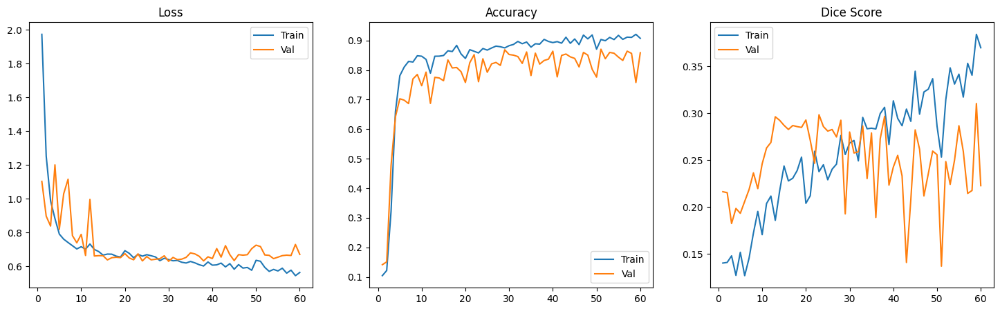

Plot saved to training_history.png


In [ ]:
BASE_DIR = "/home/dhuencho/dev_py/0001_start_pytorch/src/UCL_AI4SD/CW2/attention-mechanism-unet/models_pytorch/"
SAVE_PATH = "best_model_attention_unet.pth"
PLOT_PATH = "training_history.png"
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
BATCH_SIZE = 1 
NUM_EPOCHS = 60

train_loader, val_loader = get_dataloaders(batch_size=BATCH_SIZE)


model = FlexibleAttentionUNet(
    in_channels=4,
    out_channels=1,
    depth=3, 
    filter_base=32,
    use_batchnorm=True,
    dropout_rate=0.0
)


optimizer = optim.Adam(model.parameters(), lr=8.556385477088219e-05)
#criterion = nn.BCEWithLogitsLoss()
criterion = ComboLoss(bce_weight=0.3)

print("🚀 Starting Final Training...")
history = train_model(
    model, 
    train_loader, 
    val_loader, 
    criterion, 
    optimizer, 
    num_epochs=NUM_EPOCHS, 
    device=DEVICE, 
    save_path=SAVE_PATH
)

# 5. Plot
plot_history(history, PLOT_PATH)

## Old architecture new data

In [ ]:
BASE_DIR = "/home/dhuencho/dev_py/0001_start_pytorch/src/UCL_AI4SD/CW2/attention-mechanism-unet/models_pytorch/"
SAVE_PATH = "old_model_attention_unet_clp.pth"
PLOT_PATH = "training_history_old.png"
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
BATCH_SIZE = 1
NUM_EPOCHS = 60

train_loader, val_loader = get_dataloaders(batch_size=BATCH_SIZE)

In [27]:
len(val_loader)

16

In [28]:
len(train_loader)

22

🚀 Starting Final Training...


Epoch 1/38: 100%|██████████| 11/11 [00:00<00:00, 13.04it/s, loss=1.0066, acc=0.4248]


Epoch 1 Results: Train Loss: 1.0530 | Val Loss: 0.8080 | Val Acc: 0.4498 | Val Dice: 0.1954
🔥 New Best Model Saved! (Dice: 0.1954)


Epoch 2/38: 100%|██████████| 11/11 [00:00<00:00, 17.77it/s, loss=1.0292, acc=0.4179]


Epoch 2 Results: Train Loss: 1.0724 | Val Loss: 0.8286 | Val Acc: 0.4119 | Val Dice: 0.2052
🔥 New Best Model Saved! (Dice: 0.2052)


Epoch 3/38: 100%|██████████| 11/11 [00:00<00:00, 17.64it/s, loss=0.9765, acc=0.3758]


Epoch 3 Results: Train Loss: 1.0061 | Val Loss: 0.8226 | Val Acc: 0.4428 | Val Dice: 0.1965


Epoch 4/38: 100%|██████████| 11/11 [00:00<00:00, 17.63it/s, loss=0.8938, acc=0.4031]


Epoch 4 Results: Train Loss: 0.9692 | Val Loss: 0.8041 | Val Acc: 0.5034 | Val Dice: 0.2013


Epoch 5/38: 100%|██████████| 11/11 [00:00<00:00, 17.80it/s, loss=0.9727, acc=0.3920]


Epoch 5 Results: Train Loss: 0.9434 | Val Loss: 0.8035 | Val Acc: 0.5500 | Val Dice: 0.2110
🔥 New Best Model Saved! (Dice: 0.2110)


Epoch 6/38: 100%|██████████| 11/11 [00:00<00:00, 17.48it/s, loss=0.9168, acc=0.4113]


Epoch 6 Results: Train Loss: 0.9443 | Val Loss: 0.8198 | Val Acc: 0.5425 | Val Dice: 0.2452
🔥 New Best Model Saved! (Dice: 0.2452)


Epoch 7/38: 100%|██████████| 11/11 [00:00<00:00, 17.73it/s, loss=0.9483, acc=0.5071]


Epoch 7 Results: Train Loss: 0.9304 | Val Loss: 0.8172 | Val Acc: 0.5764 | Val Dice: 0.2508
🔥 New Best Model Saved! (Dice: 0.2508)


Epoch 8/38: 100%|██████████| 11/11 [00:00<00:00, 17.45it/s, loss=0.9695, acc=0.3841]


Epoch 8 Results: Train Loss: 0.9406 | Val Loss: 0.8167 | Val Acc: 0.5549 | Val Dice: 0.2560
🔥 New Best Model Saved! (Dice: 0.2560)


Epoch 9/38: 100%|██████████| 11/11 [00:00<00:00, 17.45it/s, loss=0.9712, acc=0.3693]


Epoch 9 Results: Train Loss: 0.8855 | Val Loss: 0.8164 | Val Acc: 0.5776 | Val Dice: 0.2687
🔥 New Best Model Saved! (Dice: 0.2687)


Epoch 10/38: 100%|██████████| 11/11 [00:00<00:00, 17.25it/s, loss=0.8482, acc=0.6020]


Epoch 10 Results: Train Loss: 0.8846 | Val Loss: 0.8023 | Val Acc: 0.6087 | Val Dice: 0.2816
🔥 New Best Model Saved! (Dice: 0.2816)


Epoch 11/38: 100%|██████████| 11/11 [00:00<00:00, 17.21it/s, loss=0.8521, acc=0.3797]


Epoch 11 Results: Train Loss: 0.8962 | Val Loss: 0.8057 | Val Acc: 0.6026 | Val Dice: 0.2913
🔥 New Best Model Saved! (Dice: 0.2913)


Epoch 12/38: 100%|██████████| 11/11 [00:03<00:00,  2.97it/s, loss=0.8054, acc=0.6414]


Epoch 12 Results: Train Loss: 0.8503 | Val Loss: 0.7998 | Val Acc: 0.6014 | Val Dice: 0.2939
🔥 New Best Model Saved! (Dice: 0.2939)


Epoch 13/38: 100%|██████████| 11/11 [00:00<00:00, 17.27it/s, loss=0.8580, acc=0.6255]


Epoch 13 Results: Train Loss: 0.8755 | Val Loss: 0.7995 | Val Acc: 0.5955 | Val Dice: 0.2983
🔥 New Best Model Saved! (Dice: 0.2983)


Epoch 14/38: 100%|██████████| 11/11 [00:00<00:00, 17.51it/s, loss=0.8749, acc=0.6300]


Epoch 14 Results: Train Loss: 0.8546 | Val Loss: 0.8065 | Val Acc: 0.6108 | Val Dice: 0.3005
🔥 New Best Model Saved! (Dice: 0.3005)


Epoch 15/38: 100%|██████████| 11/11 [00:00<00:00, 17.50it/s, loss=0.7689, acc=0.7190]


Epoch 15 Results: Train Loss: 0.8584 | Val Loss: 0.7799 | Val Acc: 0.6435 | Val Dice: 0.3131
🔥 New Best Model Saved! (Dice: 0.3131)


Epoch 16/38: 100%|██████████| 11/11 [00:00<00:00, 17.44it/s, loss=0.8819, acc=0.6438]


Epoch 16 Results: Train Loss: 0.8317 | Val Loss: 0.7608 | Val Acc: 0.6475 | Val Dice: 0.3236
🔥 New Best Model Saved! (Dice: 0.3236)


Epoch 17/38: 100%|██████████| 11/11 [00:00<00:00, 17.41it/s, loss=0.8730, acc=0.7792]


Epoch 17 Results: Train Loss: 0.8317 | Val Loss: 0.7509 | Val Acc: 0.6619 | Val Dice: 0.3299
🔥 New Best Model Saved! (Dice: 0.3299)


Epoch 18/38: 100%|██████████| 11/11 [00:00<00:00, 17.22it/s, loss=0.9018, acc=0.6780]


Epoch 18 Results: Train Loss: 0.8346 | Val Loss: 0.7665 | Val Acc: 0.6330 | Val Dice: 0.3269


Epoch 19/38: 100%|██████████| 11/11 [00:00<00:00, 17.36it/s, loss=0.8261, acc=0.7605]


Epoch 19 Results: Train Loss: 0.8064 | Val Loss: 0.7475 | Val Acc: 0.6411 | Val Dice: 0.3355
🔥 New Best Model Saved! (Dice: 0.3355)


Epoch 20/38: 100%|██████████| 11/11 [00:00<00:00, 17.22it/s, loss=0.8492, acc=0.7446]


Epoch 20 Results: Train Loss: 0.7940 | Val Loss: 0.7369 | Val Acc: 0.6370 | Val Dice: 0.3373
🔥 New Best Model Saved! (Dice: 0.3373)


Epoch 21/38: 100%|██████████| 11/11 [00:00<00:00, 17.38it/s, loss=0.7465, acc=0.7132]


Epoch 21 Results: Train Loss: 0.8061 | Val Loss: 0.7462 | Val Acc: 0.6289 | Val Dice: 0.3399
🔥 New Best Model Saved! (Dice: 0.3399)


Epoch 22/38: 100%|██████████| 11/11 [00:00<00:00, 17.41it/s, loss=0.6851, acc=0.7437]


Epoch 22 Results: Train Loss: 0.8127 | Val Loss: 0.7386 | Val Acc: 0.6575 | Val Dice: 0.3423
🔥 New Best Model Saved! (Dice: 0.3423)


Epoch 23/38: 100%|██████████| 11/11 [00:00<00:00, 17.46it/s, loss=0.8909, acc=0.7146]


Epoch 23 Results: Train Loss: 0.7845 | Val Loss: 0.7438 | Val Acc: 0.6392 | Val Dice: 0.3411


Epoch 24/38: 100%|██████████| 11/11 [00:00<00:00, 17.67it/s, loss=0.8684, acc=0.6193]


Epoch 24 Results: Train Loss: 0.8183 | Val Loss: 0.7252 | Val Acc: 0.6584 | Val Dice: 0.3493
🔥 New Best Model Saved! (Dice: 0.3493)


Epoch 25/38: 100%|██████████| 11/11 [00:00<00:00, 17.75it/s, loss=0.7751, acc=0.7931]


Epoch 25 Results: Train Loss: 0.7790 | Val Loss: 0.7041 | Val Acc: 0.6823 | Val Dice: 0.3600
🔥 New Best Model Saved! (Dice: 0.3600)


Epoch 26/38: 100%|██████████| 11/11 [00:00<00:00, 17.56it/s, loss=0.7161, acc=0.7194]


Epoch 26 Results: Train Loss: 0.7554 | Val Loss: 0.7056 | Val Acc: 0.6742 | Val Dice: 0.3575


Epoch 27/38: 100%|██████████| 11/11 [00:00<00:00, 17.34it/s, loss=0.4635, acc=0.7799]


Epoch 27 Results: Train Loss: 0.7877 | Val Loss: 0.7025 | Val Acc: 0.6773 | Val Dice: 0.3608
🔥 New Best Model Saved! (Dice: 0.3608)


Epoch 28/38: 100%|██████████| 11/11 [00:00<00:00, 17.42it/s, loss=0.8867, acc=0.5873]


Epoch 28 Results: Train Loss: 0.7922 | Val Loss: 0.7047 | Val Acc: 0.6785 | Val Dice: 0.3605


Epoch 29/38: 100%|██████████| 11/11 [00:00<00:00, 17.55it/s, loss=0.7872, acc=0.7717]


Epoch 29 Results: Train Loss: 0.7517 | Val Loss: 0.6989 | Val Acc: 0.6850 | Val Dice: 0.3640
🔥 New Best Model Saved! (Dice: 0.3640)


Epoch 30/38: 100%|██████████| 11/11 [00:00<00:00, 17.50it/s, loss=0.9280, acc=0.6163]


Epoch 30 Results: Train Loss: 0.7812 | Val Loss: 0.6860 | Val Acc: 0.6958 | Val Dice: 0.3684
🔥 New Best Model Saved! (Dice: 0.3684)


Epoch 31/38: 100%|██████████| 11/11 [00:00<00:00, 17.68it/s, loss=0.4681, acc=0.8675]


Epoch 31 Results: Train Loss: 0.7380 | Val Loss: 0.6935 | Val Acc: 0.6793 | Val Dice: 0.3659


Epoch 32/38: 100%|██████████| 11/11 [00:00<00:00, 17.81it/s, loss=0.8480, acc=0.7540]


Epoch 32 Results: Train Loss: 0.7670 | Val Loss: 0.6898 | Val Acc: 0.6767 | Val Dice: 0.3664


Epoch 33/38: 100%|██████████| 11/11 [00:00<00:00, 17.65it/s, loss=0.7817, acc=0.7813]


Epoch 33 Results: Train Loss: 0.7372 | Val Loss: 0.6779 | Val Acc: 0.6890 | Val Dice: 0.3703
🔥 New Best Model Saved! (Dice: 0.3703)


Epoch 34/38: 100%|██████████| 11/11 [00:00<00:00, 17.54it/s, loss=0.6164, acc=0.8223]


Epoch 34 Results: Train Loss: 0.7520 | Val Loss: 0.6833 | Val Acc: 0.6786 | Val Dice: 0.3682


Epoch 35/38: 100%|██████████| 11/11 [00:00<00:00, 17.47it/s, loss=0.6600, acc=0.7747]


Epoch 35 Results: Train Loss: 0.7438 | Val Loss: 0.6832 | Val Acc: 0.6855 | Val Dice: 0.3686


Epoch 36/38: 100%|██████████| 11/11 [00:00<00:00, 17.79it/s, loss=0.6286, acc=0.7816]


Epoch 36 Results: Train Loss: 0.7433 | Val Loss: 0.6767 | Val Acc: 0.6869 | Val Dice: 0.3698


Epoch 37/38: 100%|██████████| 11/11 [00:00<00:00, 17.70it/s, loss=0.7208, acc=0.8155]


Epoch 37 Results: Train Loss: 0.7480 | Val Loss: 0.6751 | Val Acc: 0.6903 | Val Dice: 0.3711
🔥 New Best Model Saved! (Dice: 0.3711)


Epoch 38/38: 100%|██████████| 11/11 [00:00<00:00, 17.43it/s, loss=0.6444, acc=0.7371]


Epoch 38 Results: Train Loss: 0.7185 | Val Loss: 0.6691 | Val Acc: 0.6891 | Val Dice: 0.3712
🔥 New Best Model Saved! (Dice: 0.3712)


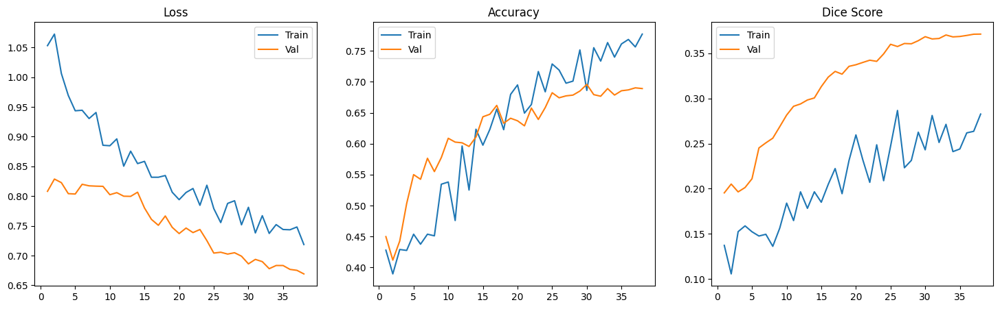

Plot saved to training_history_old.png


In [ ]:
BASE_DIR = "/home/dhuencho/dev_py/0001_start_pytorch/src/UCL_AI4SD/CW2/attention-mechanism-unet/models_pytorch/"
SAVE_PATH = "old_model_attention_unet_clp.pth"
PLOT_PATH = "training_history_old.png"
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
BATCH_SIZE = 2 
NUM_EPOCHS = 38

train_loader, val_loader = get_dataloaders(batch_size=BATCH_SIZE)

model = FlexibleAttentionUNet(
    in_channels=4,
    out_channels=1,
    depth=3, 
    filter_base=16,
    use_batchnorm=True,
    dropout_rate=0.1
)


optimizer = optim.Adam(model.parameters(), lr=7.348118405270451e-05)
#criterion = nn.BCEWithLogitsLoss()
criterion = ComboLoss(bce_weight=0.2)

print("🚀 Starting Final Training...")
history = train_model(
    model, 
    train_loader, 
    val_loader, 
    criterion, 
    optimizer, 
    num_epochs=NUM_EPOCHS, 
    device=DEVICE, 
    save_path=SAVE_PATH
)

plot_history(history, PLOT_PATH)

## Metric helper functions

In [ ]:
import time
import numpy as np
import torch
import matplotlib.pyplot as plt
from sklearn.metrics import jaccard_score

def get_prediction(model, image_tensor, device='cuda'):
    """
    Runs inference on a single image or batch.
    Args:
        model: PyTorch model
        image_tensor: Tensor (C, H, W) or (B, C, H, W)
    Returns:
        pred_mask: Binary numpy array (0 or 1)
    """
    model.eval()
    
    if len(image_tensor.shape) == 3:
        image_tensor = image_tensor.unsqueeze(0)
        
    image_tensor = image_tensor.to(device)
    
    with torch.no_grad():
        logits = model(image_tensor)
        probs = torch.sigmoid(logits)
        preds = (probs > 0.5).float()
        
    return preds.cpu().numpy()

In [ ]:
def measure_inference_time(model, device='cuda', input_size=(1, 3, 512, 512)):
    """
    Measures pure inference time on the GPU.
    """
    model.to(device)
    model.eval()
    
    dummy_input = torch.randn(input_size).to(device)
    
    for _ in range(10):
        _ = model(dummy_input)
        
    torch.cuda.synchronize() 
    
    start_time = time.time()
    for _ in range(100):
        _ = model(dummy_input)
    torch.cuda.synchronize() 
    end_time = time.time()
    
    avg_time = (end_time - start_time) / 100
    print(f"Average Inference Time: {avg_time*1000:.2f} ms per image")
    return avg_time

def evaluate_metrics(model, dataloader, device='cuda'):
    """
    Computes Jaccard (IoU) and Dice Score over the entire test set.
    """
    model.eval()
    jaccard_scores = []
    dice_scores = []
    accuracy_scores = []
    mse_scores = []
    
    print(f"Evaluating over {len(dataloader)} batches...")
    
    with torch.no_grad():
        for images, masks in dataloader:
            images = images.to(device)
    
            masks_np = masks.numpy().flatten()

            logits = model(images)
            probs = torch.sigmoid(logits)
            preds = (probs > 0.5).float()
            preds_np = preds.cpu().numpy().flatten()
            probs_np = probs.cpu().numpy().flatten()
            
            iou = jaccard_score(masks_np, preds_np, average='binary') 
            jaccard_scores.append(iou)
            
            intersection = np.logical_and(masks_np, preds_np).sum()
            dice = (2. * intersection + 1e-6) / (masks_np.sum() + preds_np.sum() + 1e-6)
            dice_scores.append(dice)

            acc = (preds_np == masks_np).mean()
            accuracy_scores.append(acc)
            
            mse = ((probs_np - masks_np) ** 2).mean()
            mse_scores.append(mse)

            
    mean_iou = np.mean(jaccard_scores)
    std_iou = np.std(jaccard_scores)
    mean_dice = np.mean(dice_scores)
    std_dice = np.std(dice_scores)  
    mean_acc = np.mean(accuracy_scores)
    std_acc = np.std(accuracy_scores)
    mean_mse = np.mean(mse_scores)
    std_mse = np.std(mse_scores)

    
    print(f"\n--- Results ---")
    print(f"Jaccard Index (IoU): {mean_iou:.4f} ± {std_iou:.4f}")
    print(f"Dice Coefficient:    {mean_dice:.4f} ± {std_dice:.4f}")
    print(f"Accuracy:            {mean_acc:.4f} ± {std_acc:.4f}")
    print(f"MSE:                 {mean_mse:.6f} ± {std_mse:.6f}")
    
    
    return mean_iou, mean_dice

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import torch

def visualize_predictions(model, dataloader, device='cuda', num_samples=3):
    """
    Plots [Image, Mask, Prediction] for 'num_samples' images.
    Calculates and displays Dice Score in the title.
    """
    model.eval()

    accumulated_images = []
    accumulated_masks = []
    accumulated_preds = []
    
    for batch_images, batch_masks in dataloader:
        if len(accumulated_images) >= num_samples:
            break
            
        images_gpu = batch_images.to(device)
        
        with torch.no_grad():
            logits = model(images_gpu)
            probs = torch.sigmoid(logits)
            preds = (probs > 0.5).float()
        
        for i in range(len(batch_images)):
            if len(accumulated_images) >= num_samples:
                break
                
            img_np = batch_images[i].permute(1, 2, 0).numpy() 
            mask_np = batch_masks[i].numpy().squeeze()        
            pred_np = preds[i].cpu().numpy().squeeze()        
            
            accumulated_images.append(img_np)
            accumulated_masks.append(mask_np)
            accumulated_preds.append(pred_np)

    # 2. Plotting
    print(f"Visualizing {len(accumulated_images)} samples...")
    
    plt.figure(figsize=(15, 5 * len(accumulated_images)))
    
    for i in range(len(accumulated_images)):

        mask_t = accumulated_masks[i]
        pred_t = accumulated_preds[i]


        intersection = np.logical_and(mask_t, pred_t).sum()
        total_pixels = mask_t.sum() + pred_t.sum()
        
        if total_pixels == 0:

            dice_score = 1.0
        else:
            dice_score = (2. * intersection) / total_pixels

        accuracy = (mask_t == pred_t).mean()

        plt.subplot(len(accumulated_images), 3, i*3 + 1)
        plt.imshow(accumulated_images[i])
        plt.title(f"Sample {i+1}: Satellite Image")
        plt.axis('off')
        

        plt.subplot(len(accumulated_images), 3, i*3 + 2)
        plt.imshow(mask_t, cmap='gray', vmin=0, vmax=1)
        plt.title("Ground Truth Mask")
        plt.axis('off')
        
        plt.subplot(len(accumulated_images), 3, i*3 + 3)
        plt.imshow(pred_t, cmap='gray', vmin=0, vmax=1)
        
        # Color code the title: Green if good (>0.8), Red if bad
        title_color = 'green' if dice_score > 0.8 else 'red'
        
        plt.title(f"Prediction\nDice: {dice_score:.4f} | Acc: {accuracy:.2f}", 
                  color=title_color, fontweight='bold')
        plt.axis('off')
        
    plt.tight_layout()
    plt.show()

In [ ]:

def load_model(model_class, model_path, in_channels=4, **kwargs):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    checkpoint = torch.load(model_path, map_location=device)
    
    model = model_class(in_channels=in_channels, **kwargs)
    

    if isinstance(checkpoint, dict) and 'model_state_dict' in checkpoint:

        print(f"Loading '{model_path}' from dictionary checkpoint...")
        model.load_state_dict(checkpoint['model_state_dict'])
    else:

        print(f"Loading '{model_path}' directly from state_dict...")
        model.load_state_dict(checkpoint)

    model.to(device)
    model.eval()
    return model

# Example: Load Attention U-Net 4-Band
attn_unet_4band = load_model(AttentionUNet, 'models_pytorch/attention-unet-4d.pth', in_channels=4)

old_clp = load_model(FlexibleAttentionUNet, '/home/dhuencho/dev_py/0001_start_pytorch/src/UCL_AI4SD/CW2/attention-mechanism-unet/models_pytorch/old_model_attention_unet_clp_final.pth', in_channels=4, depth=3, filter_base=16, use_batchnorm=True, dropout_rate=0.1)

new_clp = load_model(FlexibleAttentionUNet, '/home/dhuencho/dev_py/0001_start_pytorch/src/UCL_AI4SD/CW2/attention-mechanism-unet/models_pytorch/best_model_attention_unet_final.pth', in_channels=4, depth=3, filter_base=32, use_batchnorm=True, dropout_rate=0.0)


Loading 'models_pytorch/attention-unet-4d.pth' from dictionary checkpoint...
Loading '/home/dhuencho/dev_py/0001_start_pytorch/src/UCL_AI4SD/CW2/attention-mechanism-unet/models_pytorch/old_model_attention_unet_clp_final.pth' directly from state_dict...
Loading '/home/dhuencho/dev_py/0001_start_pytorch/src/UCL_AI4SD/CW2/attention-mechanism-unet/models_pytorch/best_model_attention_unet_final.pth' directly from state_dict...


/tmp/ipykernel_244885/1378973876.py:7: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(model_path, map_location=device)


In [ ]:
BATCH_SIZE = 1
NUM_EPOCHS = 60

train_loader, val_loader = get_dataloaders(batch_size=BATCH_SIZE)

print("Length of train loader:", len(train_loader))
print("Length of validation loader:", len(val_loader))

Length of train loader: 22
Length of validation loader: 16


### Metric with noisy mask

In [ ]:

measure_inference_time(attn_unet_4band, input_size=(1, 4, 512, 512))
measure_inference_time(old_clp, input_size=(1, 4, 512, 512))
measure_inference_time(new_clp, input_size=(1, 4, 512, 512))

evaluate_metrics(attn_unet_4band, val_loader)
evaluate_metrics(old_clp, val_loader)
evaluate_metrics(new_clp, val_loader)
    
#visualize_predictions(attn_unet_4band, val_loader, num_samples=2)

Average Inference Time: 4.54 ms per image
Average Inference Time: 4.21 ms per image
Average Inference Time: 11.28 ms per image
Evaluating over 16 batches...

--- Results ---
Jaccard Index (IoU): 0.0028 ± 0.0045
Dice Coefficient:    0.0056 ± 0.0088
Accuracy:            0.4806 ± 0.1885
MSE:                 0.470121 ± 0.196470
Evaluating over 16 batches...

--- Results ---
Jaccard Index (IoU): 0.2293 ± 0.2145
Dice Coefficient:    0.3280 ± 0.2602
Accuracy:            0.6891 ± 0.1529
MSE:                 0.210033 ± 0.100716
Evaluating over 16 batches...

--- Results ---
Jaccard Index (IoU): 0.2148 ± 0.2090
Dice Coefficient:    0.3105 ± 0.2535
Accuracy:            0.7579 ± 0.1264
MSE:                 0.203016 ± 0.108731


(np.float64(0.21481667041297825), np.float64(0.31049319852412927))

In [ ]:
base_dir2 = r"./chile/"

def get_4band_files(base_dir, split="Training"):

    if split == "Training":
        img_folder, mask_folder = "image", "label"
    elif split == "Test":
        img_folder, mask_folder = "images", "masks"
    elif split == "Validation":
        img_folder, mask_folder = "images", "masks"
        
    # Get Paths
    img_path = os.path.join(base_dir, split, img_folder)
    mask_path = os.path.join(base_dir, split, mask_folder)
    

    image_files = sorted(glob.glob(os.path.join(img_path, "*")))

    mask_files = []
    for img in image_files:
        filename = os.path.basename(img)
        mask_files.append(os.path.join(mask_path, filename))
        
    return image_files, mask_files


#train_imgs, train_masks = get_4band_files(base_dir2, "Training")
test_imgs, test_masks = get_4band_files(base_dir2, "Test")


# train_ds_4band = FourBandAmazonDataset(
#     train_imgs, 
#     train_masks, 
#     transform=get_4band_transforms("train")
# )

test_ds_4band_cl = FourBandAmazonDataset(
    test_imgs, 
    test_masks, 
    transform=get_4band_transforms("test")
)


#train_loader_4band = DataLoader(train_ds_4band, batch_size=2, shuffle=True, num_workers=2)
test_loader_4band_cl = DataLoader(test_ds_4band_cl, batch_size=2, shuffle=False, num_workers=2)

print(" 4-Band Pipeline Ready") 

✅ 4-Band Pipeline Ready


### Metric with NDVI mask

In [ ]:

measure_inference_time(attn_unet_4band, input_size=(1, 4, 512, 512))
measure_inference_time(old_clp, input_size=(1, 4, 512, 512))
measure_inference_time(new_clp, input_size=(1, 4, 512, 512))
evaluate_metrics(attn_unet_4band, test_loader_4band_cl)
evaluate_metrics(old_clp, test_loader_4band_cl)
evaluate_metrics(new_clp, test_loader_4band_cl)


Average Inference Time: 4.62 ms per image
Average Inference Time: 4.31 ms per image
Average Inference Time: 25.76 ms per image
Evaluating over 3 batches...

--- Results ---
Jaccard Index (IoU): 0.7962 ± 0.0432
Dice Coefficient:    0.8859 ± 0.0267
Accuracy:            0.9082 ± 0.0141
MSE:                 0.065705 ± 0.009790
Evaluating over 3 batches...

--- Results ---
Jaccard Index (IoU): 0.9410 ± 0.0212
Dice Coefficient:    0.9695 ± 0.0113
Accuracy:            0.9722 ± 0.0125
MSE:                 0.021374 ± 0.008791
Evaluating over 3 batches...

--- Results ---
Jaccard Index (IoU): 0.9132 ± 0.0320
Dice Coefficient:    0.9543 ± 0.0174
Accuracy:            0.9577 ± 0.0194
MSE:                 0.030830 ± 0.013440


(np.float64(0.9131681093811449), np.float64(0.9543221052971839))

## Visualization of model performance

Visualizing 16 samples...


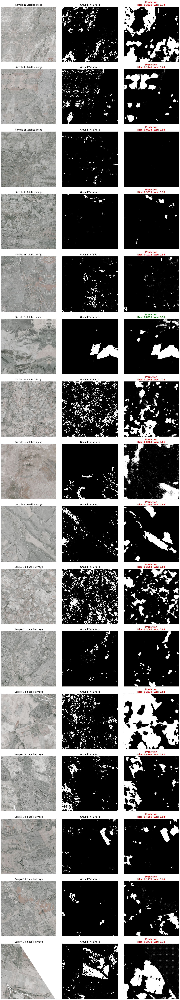

In [48]:
visualize_predictions(new_clp, train_loader, num_samples=16)